<img src="../_static/images/city2graph_logo.png" alt="City2Graph Logo" width="300"/>

# City2Graph: Urban Morphological Network Analysis

This notebook demonstrates the use of the city2graph package for analyzing urban form and creating morphological network representations. City2Graph enables the conversion of spatial urban data into graph representations that can be used for various urban analytics and machine learning tasks.

## Overview

In this notebook, we'll walk through the following workflow:

1. **Data Preparation**: Loading and processing street segments and building data
2. **Space Division**: Creating morphological tessellations to represent private spaces
3. **Network Creation**: Generating different types of morphological networks:
   - Private-to-private connections (between adjacent private spaces)
   - Public-to-public connections (between street segments)
   - Private-to-public connections (between private spaces and streets)
4. **Graph Conversion**: Converting spatial networks to graph representations using PyTorch Geometric
5. **Visualization**: Exploring different ways to visualize the morphological networks

These graph representations enable various analyses of urban form, including connectivity studies, accessibility measures, and graph-based machine learning for urban analytics.

## 1. Setup and Environment

First, let's import the necessary libraries and set up our environment.

In [1]:
import os
import sys
from pathlib import Path
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString, Polygon
import networkx as nx

# Configure matplotlib for better visualizations
plt.rcParams['figure.figsize'] = (12, 10)
plt.rcParams['figure.dpi'] = 100
plt.style.use('ggplot')

In [2]:
# Import momepy - if a custom path exists, use it; otherwise use the installed version
momepy_path = Path(os.path.expanduser("~/Projects/momepy-yuta"))
if momepy_path.exists():
    sys.path.insert(0, str(momepy_path))
    import momepy
    print(f"momepy imported from custom path: {momepy_path}")
else:
    import momepy
    print("Using installed momepy package")

# Import city2graph package
city2graph_path = Path(os.path.expanduser("~/Projects/city2graph"))
if city2graph_path.exists():
    sys.path.insert(0, str(city2graph_path))
    import city2graph
    print(f"city2graph imported from: {city2graph_path}")
    print(f"city2graph version: {city2graph.__version__ if hasattr(city2graph, '__version__') else 'dev'}")

momepy imported from custom path: /Users/yutasato/Projects/momepy-yuta
city2graph imported from: /Users/yutasato/Projects/city2graph
city2graph version: dev


## 2. Data Loading and Preparation

We'll work with data from Liverpool, UK, including building footprints and road network segments. These data are stored as GeoJSON files.

In [3]:
# Load GeoJSON files
buildings_gdf = gpd.read_file("liverpool_building.geojson")
segments_gdf = gpd.read_file("liverpool_segment.geojson")
connectors_gdf = gpd.read_file("liverpool_connector.geojson")

# Convert to British National Grid (EPSG:27700) for accurate spatial analysis
buildings_gdf = buildings_gdf.to_crs(epsg=27700)
segments_gdf = segments_gdf.to_crs(epsg=27700)
connectors_gdf = connectors_gdf.to_crs(epsg=27700)

print(f"Loaded {len(buildings_gdf)} buildings, {len(segments_gdf)} segments, and {len(connectors_gdf)} connectors")

Loaded 3124 buildings, 3396 segments, and 4402 connectors


## 3. Street Network Processing

We'll process the street segments to handle special cases like tunnels and prepare them for network analysis.

In [4]:
# Filter road segments and process them to handle tunnels
segments_gdf = segments_gdf[segments_gdf["subtype"] == "road"].copy()

# Identify tunnels and set their geometry to None
segments_gdf["barrier_mask"] = segments_gdf["level_rules"].apply(city2graph.identify_barrier_mask)

# Split segments by connectors
segments_gdf = city2graph.split_segments_by_connectors(segments_gdf, connectors_gdf)

# Calculate the length of each segment
segments_gdf["length"] = segments_gdf.geometry.length

# Create barrier_geometry column by processing each segment (excluding tunnels)
segments_gdf["barrier_geometry"] = city2graph.get_barrier_geometry(segments_gdf)

## 4. Create Enclosed Tessellations

/opt/anaconda3/envs/city2graph_env/lib/python3.12/site-packages/pandas/core/arraylike.py:492: RuntimeWarning: invalid value encountered in create_collection
  return getattr(ufunc, method)(*new_inputs, **kwargs)


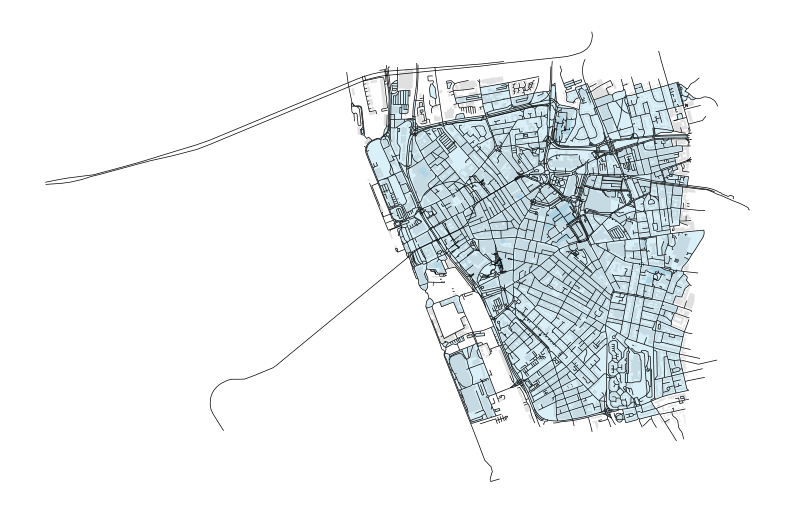

In [5]:
# Generate enclosure
enclosures = momepy.enclosures(segments_gdf["barrier_geometry"])

# Apply the function to each enclosure
enclosed_tess = momepy.enclosed_tessellation(
    buildings_gdf,
    enclosures=enclosures,
    #inner_barriers=segments_gdf["barrier_geometry"]
)

enclosed_tess["tess_id"] = [ f"{i}_{j}" for i,j in zip(enclosed_tess["enclosure_index"], enclosed_tess.index)]
enclosed_tess.reset_index(drop=True, inplace=True)

# Preview the tessellation
f, ax = plt.subplots(figsize=(10, 10))
buildings_gdf.plot(ax=ax, color='lightgrey', alpha=0.7)
segments_gdf.plot(ax=ax, color='black', linewidth=0.5)
enclosed_tess.plot(ax=ax, color='skyblue', alpha=0.3)
ax.set_axis_off()
plt.show()

## 5. Define Study Area

To focus our analysis, we'll extract a subarea around a point of interest in Liverpool.

In [6]:
# Example use:
# Convert center coordinate (lon, lat) to target CRS (EPSG:27700)
threshold = 1000  # meters

center_point = gpd.GeoSeries([Point((-2.9879004, 53.4062724))], crs='EPSG:4326').to_crs(epsg=27700)
segments_study = city2graph.extract_nearby_segments(segments_gdf, center_point, threshold=threshold)
segments_study["barrier_geometry"] = gpd.GeoSeries(segments_study["barrier_geometry"], crs=segments_study.crs)

In [7]:
# Get the enclosure index that are adjacent to the segments using a spatial join
adjacent_enclosures = gpd.sjoin(enclosed_tess, segments_study, how='inner', predicate='intersects')
adjacent_enclosure_indices = adjacent_enclosures['enclosure_index'].unique()

# Get enclosed tessellation for the adjacent enclosures
enclosed_tess = enclosed_tess[enclosed_tess['enclosure_index'].isin(adjacent_enclosure_indices)]

buildings_study = buildings_gdf[buildings_gdf.geometry.intersects(enclosed_tess.union_all())]

## 6. Create Morphological Networks

Now we'll create three types of network connections that capture different aspects of urban morphology:

### 6.1 Private-to-Private Network

This network represents connections between adjacent private spaces (tessellation cells).

In [8]:
# Create connections between adjacent private spaces (tessellation cells)
private_to_private = city2graph.create_private_to_private(
    enclosed_tess,                # Private space polygons
    private_id_col='tess_id',     # Column with unique IDs
    group_col="enclosure_index",  # Group by enclosures
    contiguity='queen'            # Use queen contiguity (shared point or edge)
)

print(f"Generated {len(private_to_private)} connections between private spaces")
print("Sample connections:")
private_to_private.head(3)

/opt/anaconda3/envs/city2graph_env/lib/python3.12/site-packages/libpysal/weights/contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 3 disconnected components.
 There are 2 islands with ids: 2, 4.
  W.__init__(self, neighbors, ids=ids, **kw)


Generated 1173 connections between private spaces
Sample connections:


/opt/anaconda3/envs/city2graph_env/lib/python3.12/site-packages/libpysal/weights/contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
 There is 1 island with id: 22.
  W.__init__(self, neighbors, ids=ids, **kw)


,from_private_id,to_private_id,enclosure_index,geometry
0,37_38,37_39,37,"LINESTRING (333987.856 390104.918, 334022.834 ..."
1,37_38,37_59,37,"LINESTRING (333987.856 390104.918, 334043.403 ..."
2,37_39,37_59,37,"LINESTRING (334022.834 390101.696, 334043.403 ..."


### 6.2 Public-to-Public Network

This network represents connections between public spaces (street segments).

In [9]:
# Create connections between street segments
public_to_public = city2graph.create_public_to_public(
    segments_study,          # Public space lines
    public_id_col='id',      # Column with unique IDs
    tolerance=1              # Tolerance for endpoint connections (meters)
)

print(f"Generated {len(public_to_public)} connections between public spaces")
print("Sample connections:")
public_to_public.head(3)

Generated 1459 connections between public spaces
Sample connections:


,from_public_id,to_public_id,geometry
0,08a19510732a7fff047997c5665f8884_1,08919510732bffff046bdfd7b18c1749_2,"LINESTRING (334367.15 390577.057, 334366.427 3..."
1,08a19510732a7fff047997c5665f8884_1,08819510733fffff047bfda80a7d159d_7,"LINESTRING (334367.15 390577.057, 334368.972 3..."
2,08a19510732a7fff047997c5665f8884_1,08819510733fffff047f8bd3c83fb407_2,"LINESTRING (334367.15 390577.057, 334382.031 3..."


### 6.3 Private-to-Public Network

This network represents connections between private spaces (tessellation cells) and public spaces (street segments).

In [10]:
# Create connections between private spaces and public spaces
private_to_public = city2graph.create_private_to_public(
    enclosed_tess,               # Private space polygons
    segments_study,              # Public space lines
    private_id_col='tess_id',    # Column with private space IDs
    public_id_col='id',          # Column with public space IDs
    public_geom_col='barrier_geometry',  # Use processed geometry for streets
    tolerance=1                  # Buffer tolerance for spatial joins (meters)
)

print(f"Generated {len(private_to_public)} connections between private and public spaces")
print("Sample connections:")
private_to_public.head(3)

Generated 4116 connections between private and public spaces
Sample connections:


,private_id,public_id,geometry
0,1025_-169,0891951073abffff046fb3d197892181_2,"LINESTRING (334821.341 391204.128, 334832.4 39..."
1,1025_-169,08a1951073ab7fff047ba6bd1ab7a85f_1,"LINESTRING (334821.341 391204.128, 334796.751 ..."
2,1027_-167,08a1951073ab7fff047db6b56b7053e8_1,"LINESTRING (334793.662 391194.593, 334791.829 ..."


## 7. Visualize Morphological Networks

Let's create a comprehensive visualization of all three networks to understand their structure and relationships.

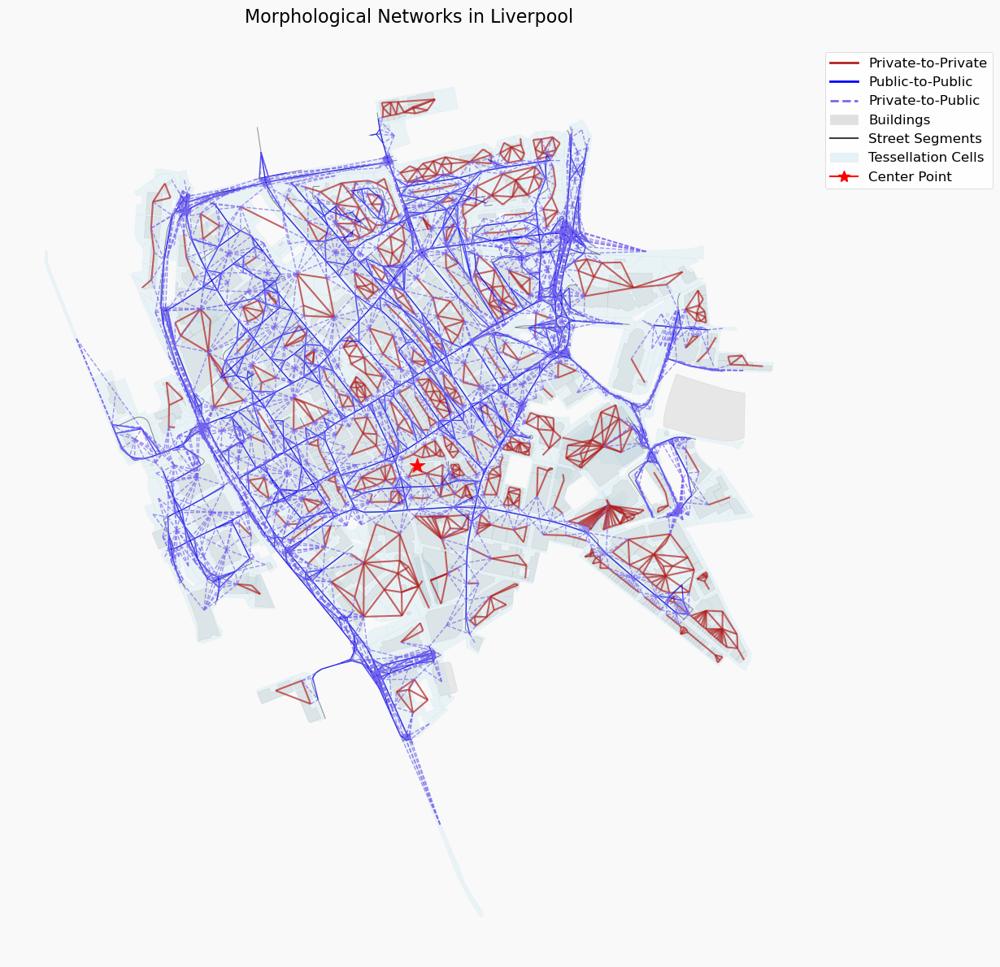

In [11]:
# Set up the figure with a nice size and background
fig, ax = plt.subplots(figsize=(14, 12), facecolor='#f9f9f9')

# Plot central point
ax.scatter(center_point.x, center_point.y, color='red', marker='*', s=200, zorder=5, label='Center Point')

# Plot background elements with improved styling
buildings_study.plot(ax=ax, color='#e0e0e0', edgecolor='#c0c0c0', linewidth=0.3, alpha=0.7)
segments_study.plot(ax=ax, color='#404040', linewidth=0.7, alpha=0.6)
enclosed_tess.plot(ax=ax, color='#ADD8E6', edgecolor='#87CEEB', linewidth=0.2, alpha=0.2)

# Plot the three network types with distinctive styles
private_to_private.plot(ax=ax, color='#B22222', linewidth=1.5, alpha=0.7)
public_to_public.plot(ax=ax, color='#0000FF', linewidth=1.0, alpha=0.7)
private_to_public.plot(ax=ax, color='#7B68EE', linewidth=1.0, alpha=0.7, linestyle='--')

# Create a legend with clear labels
legend_elements = [
    plt.Line2D([0], [0], color='#B22222', lw=2, label='Private-to-Private'),
    plt.Line2D([0], [0], color='#0000FF', lw=2, label='Public-to-Public'),
    plt.Line2D([0], [0], color='#7B68EE', lw=2, linestyle='--', label='Private-to-Public'),
    plt.Rectangle((0, 0), 1, 1, color='#e0e0e0', label='Buildings'),
    plt.Line2D([0], [0], color='#404040', lw=1.5, label='Street Segments'),
    plt.Rectangle((0, 0), 1, 1, color='#ADD8E6', alpha=0.3, label='Tessellation Cells'),
    plt.Line2D([0], [0], color='red', marker='*', markersize=10, label='Center Point')
]

# Position the legend outside the plot
ax.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(1.01, 1), 
          frameon=True, facecolor='white', framealpha=0.9, fontsize=12)

# Add title and remove axes
ax.set_title('Morphological Networks in Liverpool', fontsize=16, pad=20)
ax.set_axis_off()
plt.tight_layout()

plt.show()

### 7.1 Interactive Visualization with Folium

Let's create an interactive map to explore the networks more dynamically.

In [12]:
import folium

# Function to add GeoDataFrame to folium map
def add_gdf_to_map(gdf, map_obj, style_function, tooltip=None, layer_name='Layer'):
    # Create a copy and drop any problematic columns (non-JSON serializable)
    gdf_copy = gdf.copy()
    for col in ['barrier_geometry', 'geometry_difference']:
        if col in gdf_copy.columns:
            gdf_copy = gdf_copy.drop(columns=[col])
    
    # Add the GeoJSON layer
    folium.GeoJson(
        gdf_copy.to_crs(epsg=4326),
        name=layer_name,
        style_function=style_function,
        tooltip=tooltip
    ).add_to(map_obj)

# Create a base map centered around the study area
center_lat, center_lon = center_point.to_crs(epsg=4326).geometry.iloc[0].y, center_point.to_crs(epsg=4326).geometry.iloc[0].x

m = folium.Map(location=[center_lat, center_lon], zoom_start=15, 
               tiles='https://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png',
               attr='&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors &copy; <a href="https://carto.com/attributions">CARTO</a>')

# Add buildings
add_gdf_to_map(
    buildings_study, 
    m, 
    lambda x: {'fillColor': '#808080', 'color': '#404040', 'weight': 1, 'fillOpacity': 0.6},
    layer_name='Buildings'
)

# Add segments
add_gdf_to_map(
    segments_study, 
    m, 
    lambda x: {'color': '#000000', 'weight': 2, 'opacity': 0.7},
    layer_name='Street Segments'
)

# Add tessellation with lighter style
add_gdf_to_map(
    enclosed_tess, 
    m, 
    lambda x: {'fillColor': '#e6f2ff', 'color': '#99ccff', 'weight': 1, 'fillOpacity': 0.2},
    layer_name='Tessellation'
)

# Add the networks
add_gdf_to_map(
    private_to_private, 
    m, 
    lambda x: {'color': '#3366cc', 'weight': 2, 'opacity': 0.7},
    layer_name='Private-to-Private'
)

add_gdf_to_map(
    public_to_public, 
    m, 
    lambda x: {'color': '#ff6666', 'weight': 2, 'opacity': 0.7},
    layer_name='Public-to-Public'
)

add_gdf_to_map(
    private_to_public, 
    m, 
    lambda x: {'color': '#66cc66', 'weight': 2, 'opacity': 0.7, 'dashArray': '5,5'},
    layer_name='Private-to-Public'
)

# Add layer control
folium.LayerControl().add_to(m)

# Display the map
m

## 8. Convert to Graph Representations

Now we'll convert our spatial networks to graph representations using PyTorch Geometric for advanced network analysis and machine learning.

In [13]:
# Import PyTorch and PyTorch Geometric
import torch
try:
    import torch_geometric
    HAS_TORCH_GEOMETRIC = True
    print("PyTorch Geometric successfully imported")
    print(f"PyTorch version: {torch.__version__}")
    print(f"PyTorch Geometric version: {torch_geometric.__version__}")
except ImportError:
    print("PyTorch Geometric not installed. Graph functionality will be limited.")
    HAS_TORCH_GEOMETRIC = False

PyTorch Geometric successfully imported
PyTorch version: 2.4.1
PyTorch Geometric version: 2.6.1


### 8.1 Create a Homogeneous Graph

First, let's create a homogeneous graph of private spaces (tessellation cells) with their connections.

In [14]:
# Compute spatial features for tessellation cells
enclosed_tess['area'] = enclosed_tess.geometry.area
enclosed_tess['perimeter'] = enclosed_tess.geometry.length
enclosed_tess['compactness'] = 4 * np.pi * enclosed_tess['area'] / (enclosed_tess['perimeter'] ** 2)

# Show the feature distributions
enclosed_tess[['area', 'perimeter', 'compactness']].describe()

,area,perimeter,compactness
count,1149.000000,1149.000000,1149.000000
mean,1272.676399,147.288583,0.580486
std,1939.910396,108.391780,0.175552
min,7.604505,11.728656,0.037400
25%,264.529099,79.302605,0.460781
50%,604.407256,113.632890,0.619088
75%,1401.183736,183.245105,0.717896
max,23423.223026,989.812726,0.995835


In [15]:
if HAS_TORCH_GEOMETRIC:
    # Create homogeneous graph of private spaces
    private_graph = city2graph.create_homogeneous_graph(
        nodes_gdf=enclosed_tess,
        edges_gdf=private_to_private,
        id_col='tess_id',
        node_feature_cols=['area', 'perimeter', 'compactness'],
        edge_source_col='from_private_id',
        edge_target_col='to_private_id',
    )
    
    print("Homogeneous Graph of Private Spaces:")
    print(f"Number of nodes: {private_graph.x.size(0)}")
    print(f"Number of node features: {private_graph.x.size(1)}")
    print(f"Number of edges: {private_graph.edge_index.size(1)}")
    
    # Display the graph object
    print("\nGraph structure:")
    print(private_graph)

Homogeneous Graph of Private Spaces:
Number of nodes: 1149
Number of node features: 3
Number of edges: 1173

Graph structure:
Data(x=[1149, 3], edge_index=[2, 1173], edge_attr=[1173, 0], pos=[1149, 2], crs=EPSG:27700)


### 8.2 Create a Heterogeneous Graph

Now, let's create a heterogeneous graph with both private and public spaces.

In [16]:
# Compute features for public spaces (street segments)
segments_study['length'] = segments_study.geometry.length

# Show the feature distributions
segments_study[['length']].describe()

,length
count,866.000000
mean,34.456538
std,30.607631
min,1.392131
25%,12.963972
50%,24.904054
75%,47.692236
max,255.168617


In [17]:
if HAS_TORCH_GEOMETRIC:
    # Create a heterogeneous graph with both node types and multiple edge types
    hetero_graph = city2graph.create_heterogeneous_graph(
        nodes_dict={
            'private': enclosed_tess,
            'public': segments_study
        },
        edges_dict={
            ('private', 'connects_to', 'private'): private_to_private,
            ('private', 'adjacent_to', 'public'): private_to_public,
            ('public', 'connects_to', 'public'): public_to_public
        },
        node_id_cols={
            'private': 'tess_id',
            'public': 'id'
        },
        node_feature_cols={
            'private': ['area', 'perimeter', 'compactness', 'elongation'],
            'public': ['length', 'sinuosity', 'orientation']
        },
        edge_source_cols={
            ('private', 'connects_to', 'private'): 'from_private_id',
            ('private', 'adjacent_to', 'public'): 'private_id',
            ('public', 'connects_to', 'public'): 'from_public_id'
        },
        edge_target_cols={
            ('private', 'connects_to', 'private'): 'to_private_id',
            ('private', 'adjacent_to', 'public'): 'public_id',
            ('public', 'connects_to', 'public'): 'to_public_id'
        }
        )
    
    print("Heterogeneous Graph:")
    print(f"Node types: {list(hetero_graph.node_types)}")
    print(f"Edge types: {list(hetero_graph.edge_types)}")
    print("\nNode counts:")
    for node_type in hetero_graph.node_types:
        print(f"  {node_type}: {hetero_graph[node_type].x.size(0)} nodes with {hetero_graph[node_type].x.size(1)} features")
    print("\nEdge counts:")
    for edge_type in hetero_graph.edge_types:
        print(f"  {edge_type}: {hetero_graph[edge_type].edge_index.size(1)} edges")

Heterogeneous Graph:
Node types: ['private', 'public']
Edge types: [('private', 'connects_to', 'private'), ('private', 'adjacent_to', 'public'), ('public', 'connects_to', 'public')]

Node counts:
  private: 1149 nodes with 3 features
  public: 866 nodes with 1 features

Edge counts:
  ('private', 'connects_to', 'private'): 1173 edges
  ('private', 'adjacent_to', 'public'): 4116 edges
  ('public', 'connects_to', 'public'): 1459 edges


### 8.3 Create a Morphological Graph (All-in-One)

Finally, let's use the convenience function `create_morphological_graph` that combines all the previous steps.

In [18]:
if HAS_TORCH_GEOMETRIC:
    # Create morphological graph in one step
    morpho_graph = city2graph.create_morphological_graph(
        private_gdf=enclosed_tess,
        public_gdf=segments_study,
        private_id_col='tess_id',
        public_id_col='id',
        private_node_feature_cols=['area', 'perimeter', 'compactness', 'elongation'],
        public_node_feature_cols=['length', 'sinuosity', 'orientation'],
        private_group_col='enclosure_index',
        public_geom_col='barrier_geometry',
        contiguity='queen',
        tolerance=1
        )
    
    print("Morphological Graph (created in one step):")
    print(f"Node types: {list(morpho_graph.node_types)}")
    print(f"Edge types: {list(morpho_graph.edge_types)}")
    print("\nNode counts:")
    for node_type in morpho_graph.node_types:
        print(f"  {node_type}: {morpho_graph[node_type].x.size(0)} nodes with {morpho_graph[node_type].x.size(1)} features")
    print("\nEdge counts:")
    for edge_type in morpho_graph.edge_types:
        print(f"  {edge_type}: {morpho_graph[edge_type].edge_index.size(1)} edges")
        
    # Display the full graph structure
    print("\nFull graph structure:")
    print(morpho_graph)

/opt/anaconda3/envs/city2graph_env/lib/python3.12/site-packages/libpysal/weights/contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 3 disconnected components.
 There are 2 islands with ids: 2, 4.
  W.__init__(self, neighbors, ids=ids, **kw)
/opt/anaconda3/envs/city2graph_env/lib/python3.12/site-packages/libpysal/weights/contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
 There is 1 island with id: 22.
  W.__init__(self, neighbors, ids=ids, **kw)


Morphological Graph (created in one step):
Node types: ['private', 'public']
Edge types: [('private', 'connects_to', 'private'), ('private', 'adjacent_to', 'public'), ('public', 'connects_to', 'public')]

Node counts:
  private: 1149 nodes with 3 features
  public: 866 nodes with 1 features

Edge counts:
  ('private', 'connects_to', 'private'): 1173 edges
  ('private', 'adjacent_to', 'public'): 4116 edges
  ('public', 'connects_to', 'public'): 1395 edges

Full graph structure:
HeteroData(
  crs=EPSG:27700,
  private={
    x=[1149, 3],
    pos=[1149, 2],
  },
  public={
    x=[866, 1],
    pos=[866, 2],
  },
  (private, connects_to, private)={
    edge_index=[2, 1173],
    edge_attr=[1173, 0],
  },
  (private, adjacent_to, public)={
    edge_index=[2, 4116],
    edge_attr=[4116, 0],
  },
  (public, connects_to, public)={
    edge_index=[2, 1395],
    edge_attr=[1395, 0],
  }
)


## 9. Create a PyTorch Geometric Dataset

Create a persistent dataset from our morphological graph for use in machine learning tasks.

In [19]:
if HAS_TORCH_GEOMETRIC:
    import torch
    from torch_geometric.data import InMemoryDataset
    
    class MorphoGraphDataset(InMemoryDataset):
        """A PyTorch Geometric dataset containing morphological graphs."""
        
        def __init__(self, root, transform=None, pre_transform=None):
            super(MorphoGraphDataset, self).__init__(root, transform, pre_transform)
            self.data, self.slices = torch.load(self.processed_paths[0])
        
        @property
        def raw_file_names(self):
            return []  # No raw files needed
    
        @property
        def processed_file_names(self):
            return ['morpho_graph.pt']
        
        def download(self):
            # No download needed
            pass
            
        def process(self):
            # Use the existing morpho_graph as our single graph sample
            data_list = [morpho_graph]
            data, slices = self.collate(data_list)
            torch.save((data, slices), self.processed_paths[0])
    
    # Create the dataset directory if it doesn't exist
    import os
    os.makedirs('./morpho_graph_dataset/processed', exist_ok=True)
    
    # Instantiate the dataset
    dataset = MorphoGraphDataset(root='./morpho_graph_dataset')
    print(f"Dataset created with {len(dataset)} graph(s)")
    
    # Display the graph in the dataset
    print("\nDataset graph structure:")
    print(dataset[0])

Dataset created with 1 graph(s)

Dataset graph structure:
HeteroData(
  crs=EPSG:27700,
  private={
    x=[3662, 2],
    pos=[3662, 2],
  },
  public={
    x=[5784, 1],
    pos=[5784, 2],
  },
  (private, connects_to, private)={
    edge_index=[2, 4221],
    edge_attr=[4221, 0],
  },
  (private, adjacent_to, public)={
    edge_index=[2, 21712],
    edge_attr=[21712, 0],
  },
  (public, connects_to, public)={
    edge_index=[2, 8327],
    edge_attr=[8327, 0],
  }
)


/var/folders/3z/298_z_mn37d5t3730s9l90mr0000gn/T/ipykernel_39838/3447320961.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.data, self.slices = torch.load(self.pro

## 10. Convert to NetworkX for Traditional Network Analysis

NetworkX is a powerful library for traditional network analysis. Let's convert our PyTorch Geometric graph to a NetworkX graph.

In [21]:
if HAS_TORCH_GEOMETRIC:
    import networkx as nx
    
    # Convert the heterogeneous graph to a NetworkX graph
    morpho_nx = nx.DiGraph()
    
    # Add nodes with their types and attributes
    for node_type in morpho_graph.node_types:
        num_nodes = morpho_graph[node_type].num_nodes
        
        # Get node positions if available
        pos = morpho_graph[node_type].pos.numpy() if hasattr(morpho_graph[node_type], 'pos') else None
        
        # Add nodes with their attributes
        for i in range(num_nodes):
            # Create node identifier as tuple (type, index)
            node_id = (node_type, i)
            
            # Add node attributes
            attrs = {'type': node_type}
            
            # Add position if available
            if pos is not None:
                attrs['pos'] = tuple(pos[i])
                
            # Add features if available
            if hasattr(morpho_graph[node_type], 'x'):
                x = morpho_graph[node_type].x
                if x is not None and i < len(x):
                    for j, feat in enumerate(x[i]):
                        attrs[f'feat_{j}'] = feat.item()
            
            # Add the node to the graph
            morpho_nx.add_node(node_id, **attrs)
    
    # Add edges with their types
    for edge_type in morpho_graph.edge_types:
        src_type, rel_type, dst_type = edge_type
        
        # Get edge indices
        edge_index = morpho_graph[edge_type].edge_index.numpy()
        
        # Add each edge
        for j in range(edge_index.shape[1]):
            src_idx, dst_idx = edge_index[0, j], edge_index[1, j]
            src_id = (src_type, int(src_idx))
            dst_id = (dst_type, int(dst_idx))
            
            # Add the edge with its type
            morpho_nx.add_edge(src_id, dst_id, type=rel_type)
    
    print(f"Created NetworkX graph with {morpho_nx.number_of_nodes()} nodes and {morpho_nx.number_of_edges()} edges")
    print(f"Node types: {set(nx.get_node_attributes(morpho_nx, 'type').values())}")
    print(f"Edge types: {set(nx.get_edge_attributes(morpho_nx, 'type').values())}")
    
    # Compute some basic network metrics
    print("\nNetwork Analysis:")
    print(f"Is connected: {nx.is_weakly_connected(morpho_nx)}")
    print(f"Number of weakly connected components: {nx.number_weakly_connected_components(morpho_nx)}")
    
    # Get degree distribution
    degrees = [d for _, d in morpho_nx.degree()]
    print(f"Average degree: {np.mean(degrees):.2f}")
    print(f"Max degree: {np.max(degrees)}")

Created NetworkX graph with 2015 nodes and 6684 edges
Node types: {'public', 'private'}
Edge types: {'connects_to', 'adjacent_to'}

Network Analysis:
Is connected: False
Number of weakly connected components: 5
Average degree: 6.63
Max degree: 26
